In [490]:
import torch
from torch import nn
from d2l import torch as d2l
import time
from ptflops import get_model_complexity_info

# Problem 1

In [491]:
bs = 1024
data = d2l.TimeMachine(batch_size=bs, num_steps=128)

In [492]:
epochs = [5, 10, 25, 50]
hiddens = [8, 16, 32, 64]
layers = [2, 3]
chars = [50]
phrases = ['it has', 'it has a', 'it has a strong', 'it has a strong sense', 'the boy', 'the boy and the girl', 'study to show that you are']

In [493]:
def eval_nlp(model, chars, phrases):
    for phrase in phrases:
        print(f"\nInput Phrase : '{phrase}'")
        for char in chars:
            print(f"\tModel prediction out to {char} characters :\n\t{model.predict(phrase, char, data.vocab, d2l.try_gpu())}")

In [494]:
def get_complex_data(nlp, bs, vocab):
    macs, params = get_model_complexity_info(nlp, (bs, len(vocab)))
    return macs, params

In [495]:
def train_nlp(d, nlp_name, data, chars, phrases, epoch, bs):
    toc = time.perf_counter()
    d['trainer'].fit(d['model'], data)
    tic = time.perf_counter()
    total_time = round(tic-toc, 5)
    print(f"Total Training Time : {total_time} s\nEstimated Average Training Time per Epoch : {round(total_time/epoch, 5)} s")
    eval_nlp(d['model'], chars, phrases)
    framing = d[nlp_name]
    macs, params = get_complex_data(framing, bs, data.vocab)
    return total_time, macs, params

### Part A)

In [496]:
class GRU(d2l.RNN):  #@save
    """The multi-layer GRU model."""
    def __init__(self, num_inputs, num_hiddens, num_layers=1, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.GRU(num_inputs, num_hiddens, num_layers, dropout=dropout)

In [497]:
c = {}
for epoch in epochs:
    for hidden in hiddens:
        c[f'hiddens{hidden}_epochs{epoch}'] = {'gru' : GRU(num_inputs=len(data.vocab), num_hiddens=hidden),
                                               'trainer' : d2l.Trainer(max_epochs=epoch, gradient_clip_val=1, num_gpus=1)}
        c[f'hiddens{hidden}_epochs{epoch}']['model'] = d2l.RNNLM(c[f'hiddens{hidden}_epochs{epoch}']['gru'],
                                                                 vocab_size=len(data.vocab),
                                                                 lr=4)

Total Training Time : 16.89344 s
Estimated Average Training Time per Epoch : 3.37869 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

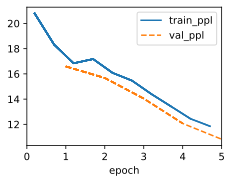

In [499]:
c[f'hiddens{hiddens[0]}_epochs{epochs[0]}']['total_time'], c[f'hiddens{hiddens[0]}_epochs{epochs[0]}']['MACs'], c[f'hiddens{hiddens[0]}_epochs{epochs[0]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[0]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 35.34396 s
Estimated Average Training Time per Epoch : 3.5344 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	s

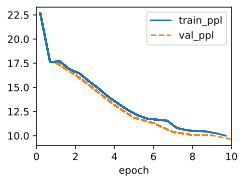

In [500]:
c[f'hiddens{hiddens[0]}_epochs{epochs[1]}']['total_time'], c[f'hiddens{hiddens[0]}_epochs{epochs[1]}']['MACs'], c[f'hiddens{hiddens[0]}_epochs{epochs[1]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[0]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 90.66656 s
Estimated Average Training Time per Epoch : 3.62666 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

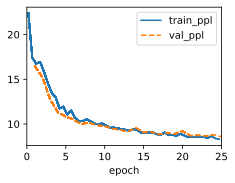

In [501]:
c[f'hiddens{hiddens[0]}_epochs{epochs[2]}']['total_time'], c[f'hiddens{hiddens[0]}_epochs{epochs[2]}']['MACs'], c[f'hiddens{hiddens[0]}_epochs{epochs[2]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[0]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 208.8725 s
Estimated Average Training Time per Epoch : 4.17745 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

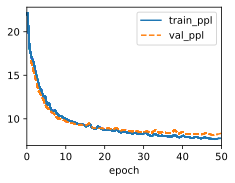

In [502]:
c[f'hiddens{hiddens[0]}_epochs{epochs[3]}']['total_time'], c[f'hiddens{hiddens[0]}_epochs{epochs[3]}']['MACs'], c[f'hiddens{hiddens[0]}_epochs{epochs[3]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[0]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

Total Training Time : 23.07959 s
Estimated Average Training Time per Epoch : 4.61592 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong an the the the the the the the the the the the th

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

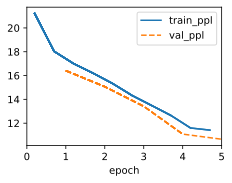

In [503]:
c[f'hiddens{hiddens[1]}_epochs{epochs[0]}']['total_time'], c[f'hiddens{hiddens[1]}_epochs{epochs[0]}']['MACs'], c[f'hiddens{hiddens[1]}_epochs{epochs[0]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[1]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 48.19755 s
Estimated Average Training Time per Epoch : 4.81975 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has and and and and and and and and and and and and a

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and and and and and and and and and and and and and

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong and and and and and and and and and and and and a

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense and and and and and and and and and and and and a

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy and and and and and and and and and and and and a

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle and and and and and and and and and and and and 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

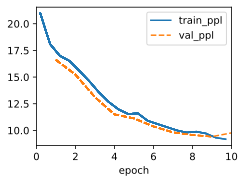

In [504]:
c[f'hiddens{hiddens[1]}_epochs{epochs[1]}']['total_time'], c[f'hiddens{hiddens[1]}_epochs{epochs[1]}']['MACs'], c[f'hiddens{hiddens[1]}_epochs{epochs[1]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[1]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 130.65428 s
Estimated Average Training Time per Epoch : 5.22617 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has and and and and and and and and and and and and a

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and and and and and and and and and and and and and

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a stronger and and and and and and and and and and and and

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensen and and and and and and and and and and and and 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy of and and and and and and and and and and and an

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


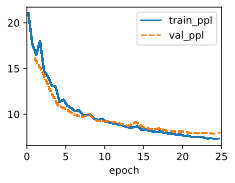

In [505]:
c[f'hiddens{hiddens[1]}_epochs{epochs[2]}']['total_time'], c[f'hiddens{hiddens[1]}_epochs{epochs[2]}']['MACs'], c[f'hiddens{hiddens[1]}_epochs{epochs[2]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[1]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 273.49256 s
Estimated Average Training Time per Epoch : 5.46985 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a me the the the the the the the the the the the th

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the gre exper the the the the the the the the

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensed the the the the the the the the the the the the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the gre exper the the the the the the the the

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl of the the the the the the the the the the the th

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


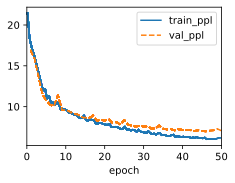

In [506]:
c[f'hiddens{hiddens[1]}_epochs{epochs[3]}']['total_time'], c[f'hiddens{hiddens[1]}_epochs{epochs[3]}']['MACs'], c[f'hiddens{hiddens[1]}_epochs{epochs[3]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[1]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

Total Training Time : 35.49828 s
Estimated Average Training Time per Epoch : 7.09966 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

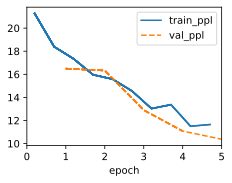

In [507]:
c[f'hiddens{hiddens[2]}_epochs{epochs[0]}']['total_time'], c[f'hiddens{hiddens[2]}_epochs{epochs[0]}']['MACs'], c[f'hiddens{hiddens[2]}_epochs{epochs[0]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[2]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 74.42397 s
Estimated Average Training Time per Epoch : 7.4424 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	s

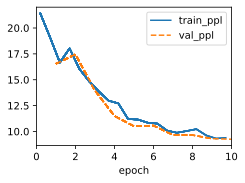

In [508]:
c[f'hiddens{hiddens[2]}_epochs{epochs[1]}']['total_time'], c[f'hiddens{hiddens[2]}_epochs{epochs[1]}']['MACs'], c[f'hiddens{hiddens[2]}_epochs{epochs[1]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[2]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 185.52771 s
Estimated Average Training Time per Epoch : 7.42111 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has is a moure a moure a moure a moure a moure a mour

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a moure a moure a moure a moure a moure a moure a m

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the time the time the time the time the time the 

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensed and the time the time the time the time the time

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the time the time the time the time the time the 

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly of the time the time the time the time the time 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


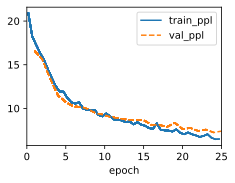

In [509]:
c[f'hiddens{hiddens[2]}_epochs{epochs[2]}']['total_time'], c[f'hiddens{hiddens[2]}_epochs{epochs[2]}']['MACs'], c[f'hiddens{hiddens[2]}_epochs{epochs[2]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[2]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 378.90825 s
Estimated Average Training Time per Epoch : 7.57817 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has all the prover dimensions of space and the prover

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has all the prover dimensions of space and the prover d

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong said the perence the the prover dimensions of spa

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensesticnd of s and said the perence the the prover di

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the prover dimensions of space and the prover dim

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly in and the prover dimensions of space and the pr

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


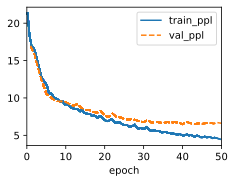

In [510]:
c[f'hiddens{hiddens[2]}_epochs{epochs[3]}']['total_time'], c[f'hiddens{hiddens[2]}_epochs{epochs[3]}']['MACs'], c[f'hiddens{hiddens[2]}_epochs{epochs[3]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[2]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

Total Training Time : 50.39291 s
Estimated Average Training Time per Epoch : 10.07858 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


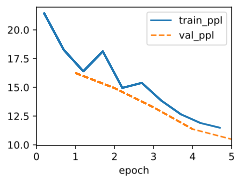

In [511]:
c[f'hiddens{hiddens[3]}_epochs{epochs[0]}']['total_time'], c[f'hiddens{hiddens[3]}_epochs{epochs[0]}']['MACs'], c[f'hiddens{hiddens[3]}_epochs{epochs[0]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[3]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 101.78856 s
Estimated Average Training Time per Epoch : 10.17886 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has an an an an an an an an an an an an an an an an a

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an an an an an an an an an an an an an an an an an 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong an an an an an an an an an an an an an an an an a

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense an an an an an an an an an an an an an an an an a

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

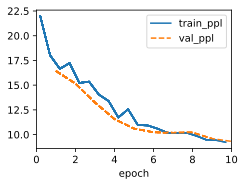

In [512]:
c[f'hiddens{hiddens[3]}_epochs{epochs[1]}']['total_time'], c[f'hiddens{hiddens[3]}_epochs{epochs[1]}']['MACs'], c[f'hiddens{hiddens[3]}_epochs{epochs[1]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[3]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 260.65535 s
Estimated Average Training Time per Epoch : 10.42621 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a diment on the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

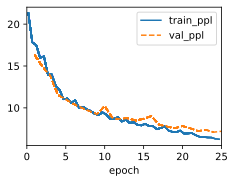

In [513]:
c[f'hiddens{hiddens[3]}_epochs{epochs[2]}']['total_time'], c[f'hiddens{hiddens[3]}_epochs{epochs[2]}']['MACs'], c[f'hiddens{hiddens[3]}_epochs{epochs[2]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[3]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 489.2697 s
Estimated Average Training Time per Epoch : 9.78539 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has all real the place the time traveller some the of

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has all real the place the time traveller some the ofle

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the time traveller some the ofle the the gravelle

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensefter and the the grome we man a mome the ofle the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the place the time traveller some the ofle the th

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle we the great the time traveller some the ofle re

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

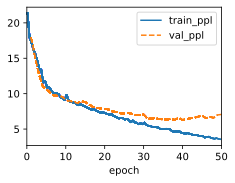

In [514]:
c[f'hiddens{hiddens[3]}_epochs{epochs[3]}']['total_time'], c[f'hiddens{hiddens[3]}_epochs{epochs[3]}']['MACs'], c[f'hiddens{hiddens[3]}_epochs{epochs[3]}']['parameters'] = train_nlp(c[f'hiddens{hiddens[3]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'gru',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

### Part B)

In [515]:
class LSTM(d2l.RNN):  #@save
    """The multi-layer LSTM model."""
    def __init__(self, num_inputs, num_hiddens, num_layers=1, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.LSTM(num_inputs, num_hiddens, num_layers, dropout=dropout)

In [516]:
d = {}
for epoch in epochs:
    for hidden in hiddens:
        d[f'hiddens{hidden}_epochs{epoch}'] = {'lstm' : LSTM(num_inputs=len(data.vocab), num_hiddens=hidden),
                                               'trainer' : d2l.Trainer(max_epochs=epoch, gradient_clip_val=1, num_gpus=1)}
        d[f'hiddens{hidden}_epochs{epoch}']['model'] = d2l.RNNLM(d[f'hiddens{hidden}_epochs{epoch}']['lstm'],
                                                                 vocab_size=len(data.vocab),
                                                                 lr=4)

Total Training Time : 16.57502 s
Estimated Average Training Time per Epoch : 3.315 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has t t t t t t t t t t t t t t t t t t t t t t t t t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a t t t t t t t t t t t t t t t t t t t t t t t t t

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong t t t t t t t t t t t t t t t t t t t t t t t t t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense t t t t t t t t t t t t t t t t t t t t t t t t t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy t t t t t t t t t t t t t t t t t t t t t t t t t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl t t t t t t t t t t t t t t t t t t t t t t t t t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	st

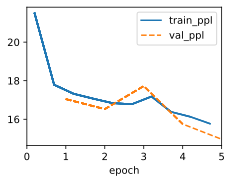

In [522]:
d[f'hiddens{hiddens[0]}_epochs{epochs[0]}']['total_time'], d[f'hiddens{hiddens[0]}_epochs{epochs[0]}']['MACs'], d[f'hiddens{hiddens[0]}_epochs{epochs[0]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[0]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 35.93348 s
Estimated Average Training Time per Epoch : 3.59335 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

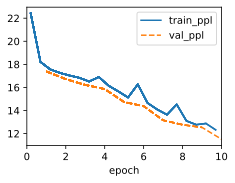

In [525]:
d[f'hiddens{hiddens[0]}_epochs{epochs[1]}']['total_time'], d[f'hiddens{hiddens[0]}_epochs{epochs[1]}']['MACs'], c[f'hiddens{hiddens[0]}_epochs{epochs[1]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[0]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 93.52588 s
Estimated Average Training Time per Epoch : 3.74104 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a the the the the the the the the the the the the t

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong a the the the the the the the the the the the the

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

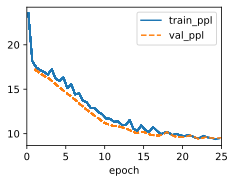

In [526]:
d[f'hiddens{hiddens[0]}_epochs{epochs[2]}']['total_time'], d[f'hiddens{hiddens[0]}_epochs{epochs[2]}']['MACs'], d[f'hiddens{hiddens[0]}_epochs{epochs[2]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[0]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 218.50255 s
Estimated Average Training Time per Epoch : 4.37005 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the and the and the and the and the and the and t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the and the and the and the and the and the and

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong and the and the and the and the and the and the a

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensere the and the and the and the and the and the and

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy and the and the and the and the and the and the a

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the and the and the and the and the and the and t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


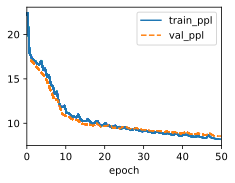

In [527]:
d[f'hiddens{hiddens[0]}_epochs{epochs[3]}']['total_time'], d[f'hiddens{hiddens[0]}_epochs{epochs[3]}']['MACs'], d[f'hiddens{hiddens[0]}_epochs{epochs[3]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[0]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

Total Training Time : 27.11408 s
Estimated Average Training Time per Epoch : 5.42282 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has te te te te te te te te te te te te te te te te t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a te te te te te te te te te te te te te te te te t

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong te te te te te te te te te te te te te te te te t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense t a a te te te te te te te te te te te te te te t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy t a te te te te te te te te te te te te te te te 

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl te te te te te te te te te te te te te te te te t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

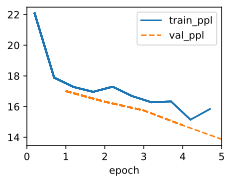

In [528]:
d[f'hiddens{hiddens[1]}_epochs{epochs[0]}']['total_time'], d[f'hiddens{hiddens[1]}_epochs{epochs[0]}']['MACs'], d[f'hiddens{hiddens[1]}_epochs{epochs[0]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[1]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 54.23765 s
Estimated Average Training Time per Epoch : 5.42377 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

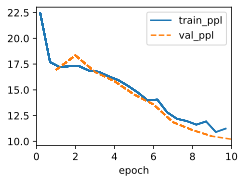

In [529]:
d[f'hiddens{hiddens[1]}_epochs{epochs[1]}']['total_time'], d[f'hiddens{hiddens[1]}_epochs{epochs[1]}']['MACs'], d[f'hiddens{hiddens[1]}_epochs{epochs[1]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[1]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 141.2162 s
Estimated Average Training Time per Epoch : 5.64865 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girler the the the the the the the the the the the the

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

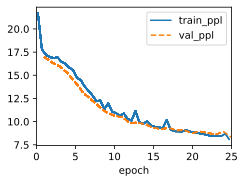

In [530]:
d[f'hiddens{hiddens[1]}_epochs{epochs[2]}']['total_time'], d[f'hiddens{hiddens[1]}_epochs{epochs[2]}']['MACs'], d[f'hiddens{hiddens[1]}_epochs{epochs[2]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[1]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 291.84955 s
Estimated Average Training Time per Epoch : 5.83699 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


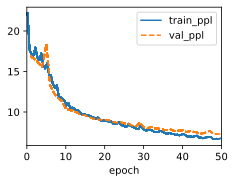

In [531]:
d[f'hiddens{hiddens[1]}_epochs{epochs[3]}']['total_time'], d[f'hiddens{hiddens[1]}_epochs{epochs[3]}']['MACs'], d[f'hiddens{hiddens[1]}_epochs{epochs[3]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[1]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

Total Training Time : 40.33348 s
Estimated Average Training Time per Epoch : 8.0667 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has e  e  e   e   e   e   e   e   e   e   e   e   e  

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a e  e   e   e   e   e   e   e   e   e   e   e   e 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong e  e  e   e   e   e   e   e   e   e   e   e   e  

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense  t e  e  e   e   e   e   e   e   e   e   e   e   

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy  e  e   e   e   e   e   e   e   e   e   e   e   e

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl e  e   e   e   e   e   e   e   e   e   e   e   e 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	s

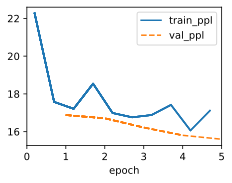

In [532]:
d[f'hiddens{hiddens[2]}_epochs{epochs[0]}']['total_time'], d[f'hiddens{hiddens[2]}_epochs{epochs[0]}']['MACs'], d[f'hiddens{hiddens[2]}_epochs{epochs[0]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[2]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 80.51481 s
Estimated Average Training Time per Epoch : 8.05148 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

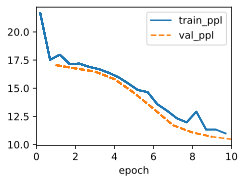

In [533]:
d[f'hiddens{hiddens[2]}_epochs{epochs[1]}']['total_time'], d[f'hiddens{hiddens[2]}_epochs{epochs[1]}']['MACs'], d[f'hiddens{hiddens[2]}_epochs{epochs[1]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[2]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 209.69376 s
Estimated Average Training Time per Epoch : 8.38775 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has a diment and the the the the the the the the the 

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a diment and the the the the the the the the the th

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


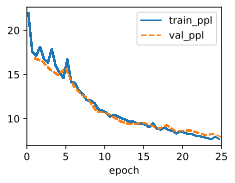

In [534]:
d[f'hiddens{hiddens[2]}_epochs{epochs[2]}']['total_time'], d[f'hiddens{hiddens[2]}_epochs{epochs[2]}']['MACs'], d[f'hiddens{hiddens[2]}_epochs{epochs[2]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[2]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 423.22116 s
Estimated Average Training Time per Epoch : 8.46442 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has of the the the the the the the the the the the th

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a ght and the the the the the the the the the the t

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensent and the the the the the the the the the the the

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy a dimentions of the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girled the the the the the the the the the the the the

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


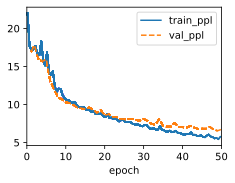

In [535]:
d[f'hiddens{hiddens[2]}_epochs{epochs[3]}']['total_time'], d[f'hiddens{hiddens[2]}_epochs{epochs[3]}']['MACs'], d[f'hiddens{hiddens[2]}_epochs{epochs[3]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[2]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

Total Training Time : 59.83267 s
Estimated Average Training Time per Epoch : 11.96653 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it hase te ate ate ate ate ate ate ate ate ate ate ate a

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has ate ate ate ate ate ate ate ate ate ate ate ate ate

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a stronge te ate ate ate ate ate ate ate ate ate ate ate a

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense tae te ate ate ate ate ate ate ate ate ate ate at

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy te ate ate ate ate ate ate ate ate ate ate ate at

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle te ate ate ate ate ate ate ate ate ate ate ate a

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


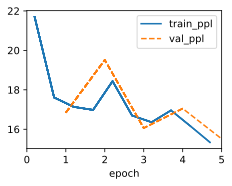

In [536]:
d[f'hiddens{hiddens[3]}_epochs{epochs[0]}']['total_time'], d[f'hiddens{hiddens[3]}_epochs{epochs[0]}']['MACs'], d[f'hiddens{hiddens[3]}_epochs{epochs[0]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[3]}_epochs{epochs[0]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[0],
                                                                                                                                                                                      bs)

Total Training Time : 121.14582 s
Estimated Average Training Time per Epoch : 12.11458 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

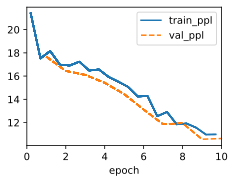

In [537]:
d[f'hiddens{hiddens[3]}_epochs{epochs[1]}']['total_time'], d[f'hiddens{hiddens[3]}_epochs{epochs[1]}']['MACs'], d[f'hiddens{hiddens[3]}_epochs{epochs[1]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[3]}_epochs{epochs[1]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[1],
                                                                                                                                                                                      bs)

Total Training Time : 304.94587 s
Estimated Average Training Time per Epoch : 12.19783 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensed the the the the the the the the the the the the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

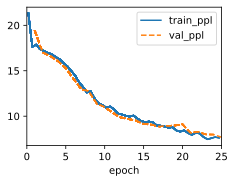

In [538]:
d[f'hiddens{hiddens[3]}_epochs{epochs[2]}']['total_time'], d[f'hiddens{hiddens[3]}_epochs{epochs[2]}']['MACs'], d[f'hiddens{hiddens[3]}_epochs{epochs[2]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[3]}_epochs{epochs[2]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[2],
                                                                                                                                                                                      bs)

Total Training Time : 632.27099 s
Estimated Average Training Time per Epoch : 12.64542 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has expere the time traveller this time traveller thi

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has along the time traveller this time traveller this t

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the time traveller this time traveller this time 

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense his beation the time traveller this time travelle

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the time traveller this time traveller this time 

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly the time traveller this time traveller this time

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

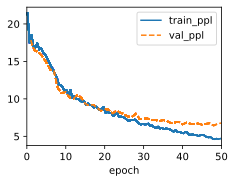

In [539]:
d[f'hiddens{hiddens[3]}_epochs{epochs[3]}']['total_time'], d[f'hiddens{hiddens[3]}_epochs{epochs[3]}']['MACs'], d[f'hiddens{hiddens[3]}_epochs{epochs[3]}']['parameters'] = train_nlp(d[f'hiddens{hiddens[3]}_epochs{epochs[3]}'],
                                                                                                                                                                                      'lstm',
                                                                                                                                                                                      data,
                                                                                                                                                                                      chars,
                                                                                                                                                                                      phrases,
                                                                                                                                                                                      epochs[3],
                                                                                                                                                                                      bs)

# Problem 2

### Part A)

In [517]:
e = {}
for layer in layers:
    for epoch in epochs[1:]:
        for hidden in hiddens[1:]:
            e[f'hiddens{hidden}_epochs{epoch}_layer{layer}'] = {'deep_gru' : GRU(num_inputs=len(data.vocab), num_hiddens=hidden, num_layers=layer),
                                                                'trainer' : d2l.Trainer(max_epochs=epoch, gradient_clip_val=1, num_gpus=1)}
            e[f'hiddens{hidden}_epochs{epoch}_layer{layer}']['model'] = d2l.RNNLM(e[f'hiddens{hidden}_epochs{epoch}_layer{layer}']['deep_gru'],
                                                                                  vocab_size=len(data.vocab),
                                                                                  lr=4)

Total Training Time : 64.66166 s
Estimated Average Training Time per Epoch : 6.46617 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has then then then then then then then then then then

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an then then then then then then then then then the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong then then then then then then then then then then

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense then then then then then then then then then then

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy then then then then then then then then then then

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle then then then then then then then then then the

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

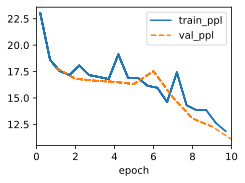

In [523]:
e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 190.82344 s
Estimated Average Training Time per Epoch : 7.63294 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong senser and the the the the the the the the the the the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


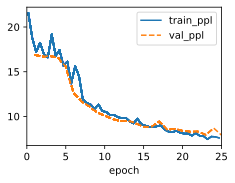

In [540]:
e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 389.66309 s
Estimated Average Training Time per Epoch : 7.79326 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boyou that the the the the the the the the the the th

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


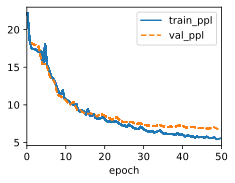

In [541]:
e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

Total Training Time : 116.2128 s
Estimated Average Training Time per Epoch : 11.62128 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it hase therentherentherentherentherentherentherentheren

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an therentherentherentherentherentherentherentheren

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a stronge therentherentherentherentherentherentherentheren

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense therentherentherentherentherentherentherentherent

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boye therentherentherentherentherentherentherentheren

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girlentherentherentherentherentherentherentherentheren

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


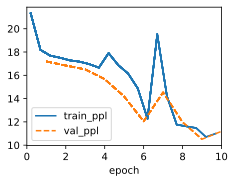

In [542]:
e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 286.71724 s
Estimated Average Training Time per Epoch : 11.46869 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the the the the the the the the the the the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensed the the the the the the the the the the the the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

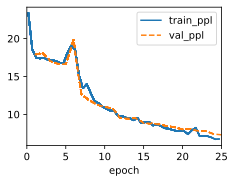

In [543]:
e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 587.98279 s
Estimated Average Training Time per Epoch : 11.75966 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has and he mean a moment of the pespect of he pearded

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and he mean a moment of the pespect of he pearded t

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the pespect of he pearded the pespect of he peard

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensed we med he mean a moment of the pespect of he pea

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the pespect of he pearded the pespect of he peard

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly of the pespect of he pearded the pespect of he p

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

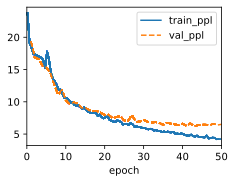

In [544]:
e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

Total Training Time : 172.78776 s
Estimated Average Training Time per Epoch : 17.27878 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has th th th th th th th th th th th th th th th th t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an th th th th th th th th th th th th th th th th 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong th th th th th th th th th th th th th th th th t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense th th th th th th th th th th th th th th th th t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy th th th th th th th th th th th th th th th th t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl th th th th th th th th th th th th th th th th t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

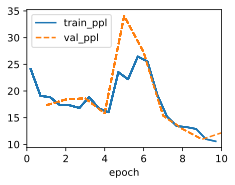

In [545]:
e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 434.72447 s
Estimated Average Training Time per Epoch : 17.38898 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has in and and and and and and and and and and and an

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and and and and and and and and and and and and and

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strongensions and and and and and and and and and and an

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensed and and and and and and and and and and and and 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy and and and and and and and and and and and and a

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly and and and and and and and and and and and and 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

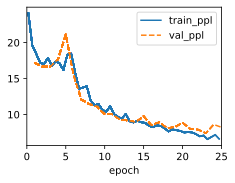

In [546]:
e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 888.13236 s
Estimated Average Training Time per Epoch : 17.76265 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has of course a sould the psychologist can move about

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a can a cuct the psychologist can move about in the

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong of the psychologist can move about in the medical

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensent of he said the psychologist can move about in t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy said the psychologist can move about in the medic

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly of the psychologist can move about in the medica

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

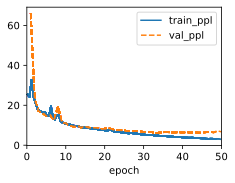

In [547]:
e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}']['total_time'], e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}']['MACs'], e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

Total Training Time : 103.74623 s
Estimated Average Training Time per Epoch : 10.37462 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it haseeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has aeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strongeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong senseeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boyeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girleeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

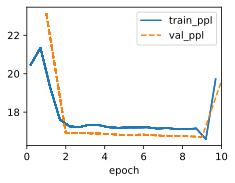

In [548]:
e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 273.02343 s
Estimated Average Training Time per Epoch : 10.92094 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an an an an an an an an an an an an an an an an an 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong senser the the the the the the the the the the the the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl an an an an an an an an an an an an an an an an a

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

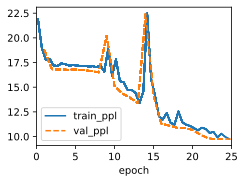

In [549]:
e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 543.29191 s
Estimated Average Training Time per Epoch : 10.86584 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the proch and the mere and the proch and the mere

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the mere and the proch and the mere and the pro

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the momension and the mere and the proch and the 

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense han the proct and the mere and the proch and the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boyt the momension and the mere and the proch and the

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl and the proch and the mere and the proch and the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

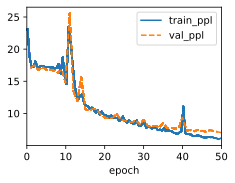

In [550]:
e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

Total Training Time : 177.66614 s
Estimated Average Training Time per Epoch : 17.76661 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it hashheeethhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthh

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has aaoeeeethhhhhoeethhhhhhthhhhhhthhhhhhthhhhhhthhhhhh

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strongeethhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhhhh

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong senseoeeethhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhh

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boyeeethhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhhh

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girlooeeethhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthhhhhhthh

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

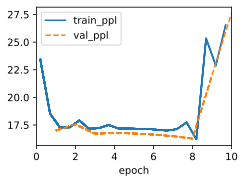

In [551]:
e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 426.1001 s
Estimated Average Training Time per Epoch : 17.044 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the thane tha the thine an the thane thane an

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an o manee an the thane tha the thine an the thane 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong an the thane thane an the the thine an the thane 

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense an the thane thane an the the thine an the thane 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boye an the thane tha the thine an the thane thane an

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girler an the the thane tha the thine an the thane tha

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	s

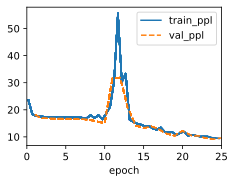

In [552]:
e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 860.89863 s
Estimated Average Training Time per Epoch : 17.21797 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has sour dimension in and sor and have experiment con

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and sor and have experiment con and sor and have ex

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong in and sor and have experiment con and sor and ha

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensent and have experiment con and sor and have experi

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boyter of the time traveller and have experiment con 

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girly said the pour dimension in and sor and have expe

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

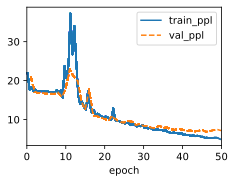

In [553]:
e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

Total Training Time : 321.5291 s
Estimated Average Training Time per Epoch : 32.15291 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it hase aoee tooe aaee aoee aoee aoee aoee aoee aoee aoe

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has aaee aoee aoee aoee aoee aoee aoee aoee aoee aoee a

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong ooe thoe thoe taoe aaee aoee aoee aoee aoee aoee 

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensetoee aaee aoee aoee aoee aoee aoee aoee aoee aoee 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boye aoee aoee aoee aoee aoee aoee aoee aoee aoee aoe

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle aoee aoee aoee aoee aoee aoee aoee aoee aoee aoe

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


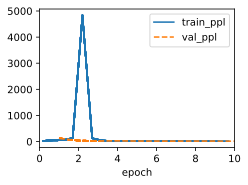

In [554]:
e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 747.93322 s
Estimated Average Training Time per Epoch : 29.91733 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has timens an time timens an time timens an time time

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an time timens an time timens an time timens an tim

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong time timens an time timens an time timens an time

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong senser te tere timens an time timens an time timens an 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy timens an time timens an time timens an time time

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girler time timens an time timens an time timens an ti

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

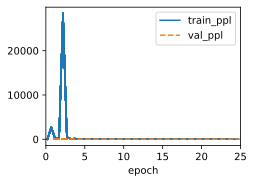

In [555]:
e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 1546.80618 s
Estimated Average Training Time per Epoch : 30.93612 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has our of the time traveller the mort the brovent th

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a mall the time traveller this is which there is wh

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strongs aronther directions introorittrinns of space the

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensents this the merically in time there is which ther

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boyils of space has alount the time traveller this is

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl back that a small liseest of the time traveller t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters 

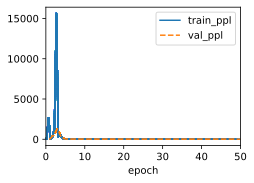

In [556]:
e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}']['total_time'], e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}']['MACs'], e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}']['parameters'] = train_nlp(e[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_gru',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

### Part B)

In [521]:
f = {}
for layer in layers:
    for epoch in epochs[1:]:
        for hidden in hiddens[1:]:
            f[f'hiddens{hidden}_epochs{epoch}_layer{layer}'] = {'deep_lstm' : LSTM(num_inputs=len(data.vocab), num_hiddens=hidden, num_layers=layer),
                                                                'trainer' : d2l.Trainer(max_epochs=epoch, gradient_clip_val=1, num_gpus=1)}
            f[f'hiddens{hidden}_epochs{epoch}_layer{layer}']['model'] = d2l.RNNLM(f[f'hiddens{hidden}_epochs{epoch}_layer{layer}']['deep_lstm'],
                                                                                  vocab_size=len(data.vocab),
                                                                                  lr=4)

Total Training Time : 80.88077 s
Estimated Average Training Time per Epoch : 8.08808 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has                                                  

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a                                                  

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong                                                  

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense                                                  

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy                                                  

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl                                                  

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :
	

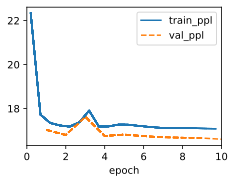

In [524]:
f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 257.50327 s
Estimated Average Training Time per Epoch : 10.30013 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl the the the the the the the the the the the the t

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

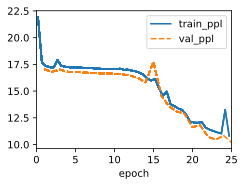

In [557]:
f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 533.07833 s
Estimated Average Training Time per Epoch : 10.66157 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has and the the merithe the merithe the merithe the m

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has and the the merithe the merithe the merithe the mer

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong and the the merithe the merithe the merithe the m

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sensed and the the merithe the merithe the merithe the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the merithe the merithe the merithe the merit

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girlent and the the merithe the merithe the merithe th

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

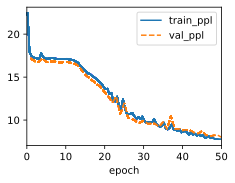

In [558]:
f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

Total Training Time : 158.88186 s
Estimated Average Training Time per Epoch : 15.88819 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has                                                  

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a                                                  

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong                                                  

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense                                                  

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy                                                  

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl                                                  

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

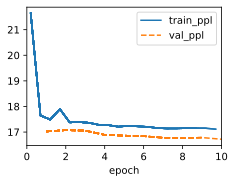

In [559]:
f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 411.61906 s
Estimated Average Training Time per Epoch : 16.46476 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an the the the the the the the the the the the the 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense the the the the the the the the the the the the t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle the the the the the the the the the the the the 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :

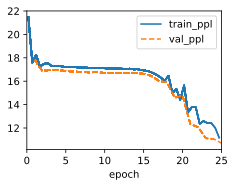

In [560]:
f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

Total Training Time : 818.2255 s
Estimated Average Training Time per Epoch : 16.36451 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has the the the the the the the the the the the the t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a the the the the the the the the the the the the t

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong the the the the the the the the the the the the t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong senser and the the the the the the the the the the the 

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy the the the the the the the the the the the the t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girling the the the the the the the the the the the th

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


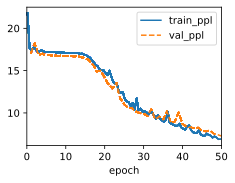

In [561]:
f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

Total Training Time : 262.3522 s
Estimated Average Training Time per Epoch : 26.23522 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has                                                  

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has a                                                  

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong                                                  

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense                                                  

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy                                                  

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girl                                                  

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


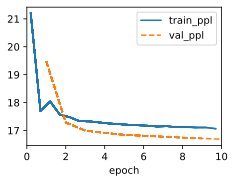

In [562]:
f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

Total Training Time : 650.7262 s
Estimated Average Training Time per Epoch : 26.02905 s

Input Phrase : 'it has'
	Model prediction out to 50 characters :
	it has there there there there there there there there t

Input Phrase : 'it has a'
	Model prediction out to 50 characters :
	it has an there there there there there there there there 

Input Phrase : 'it has a strong'
	Model prediction out to 50 characters :
	it has a strong there there there there there there there there t

Input Phrase : 'it has a strong sense'
	Model prediction out to 50 characters :
	it has a strong sense there there there there there there there there t

Input Phrase : 'the boy'
	Model prediction out to 50 characters :
	the boy there there there there there there there there t

Input Phrase : 'the boy and the girl'
	Model prediction out to 50 characters :
	the boy and the girle there there there there there there there there 

Input Phrase : 'study to show that you are'
	Model prediction out to 50 characters :


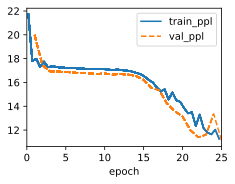

In [563]:
f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

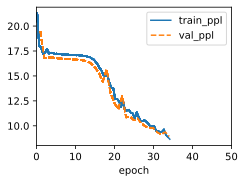

In [ ]:
f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}']['total_time'], f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}']['MACs'], f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[0]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[1]}_epochs{epochs[1]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[1]}_epochs{epochs[2]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[1]}_epochs{epochs[3]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[2]}_epochs{epochs[1]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[2]}_epochs{epochs[2]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[2]}_epochs{epochs[3]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[3]}_epochs{epochs[1]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[1],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[3]}_epochs{epochs[2]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[2],
                                                                                                                                                                                                                                          bs)

In [ ]:
f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}']['total_time'], f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}']['MACs'], f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}']['parameters'] = train_nlp(f[f'hiddens{hiddens[3]}_epochs{epochs[3]}_layer{layers[1]}'],
                                                                                                                                                                                                                                          'deep_lstm',
                                                                                                                                                                                                                                          data,
                                                                                                                                                                                                                                          chars,
                                                                                                                                                                                                                                          phrases,
                                                                                                                                                                                                                                          epochs[3],
                                                                                                                                                                                                                                          bs)